# <font style = "color:rgb(50,120,229)"> Coin Detection </font>

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## <font style = "color:rgb(50,120,229)"> Aim </font>

In this assignment, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image. Your submission will be graded based on your use of the concepts covered in this module, experimentation performed to achieve at your final solution, documentation, and finally, the total number of coins successfully detected in the images. Each part will be of 15 marks. This assignment will be entirely **manually graded** so make sure that you do NOT remove any experimentation you have done as well as the observation you made after each step.

**Proper documentation for each step should be provided with help of markdown**

## <font style = "color:rgb(50,120,229)">Outline</font>

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.

**We have also provided the results we obtained at the intermediate steps for your reference.**

# <font style = "color:rgb(50,120,229)">Assignment Part - A</font>

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

In [1]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

In [2]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5,1,'Original Image')

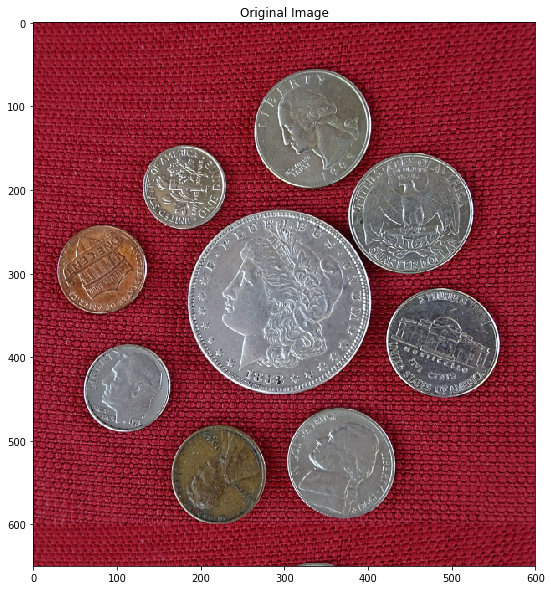

In [49]:
# Enable intellisense
%config IPCompleter.greedy=True

# Image path
imagePath = DATA_PATH + "images/CoinsA.png"
# Read image
# Store it in the variable image
###
image = cv2.imread(imagePath)
###
imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [4]:
# Convert image to grayscale
# Store it in the variable imageGray
###
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
###


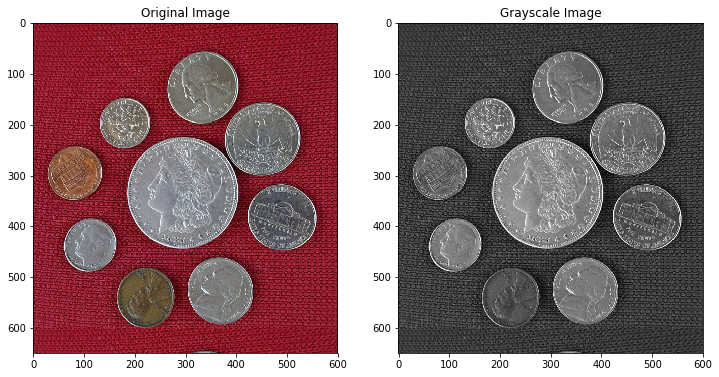

In [5]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [6]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
###
imageR = image[:,:,2]
imageG = image[:,:,1]
imageB = image[:,:,0]
###


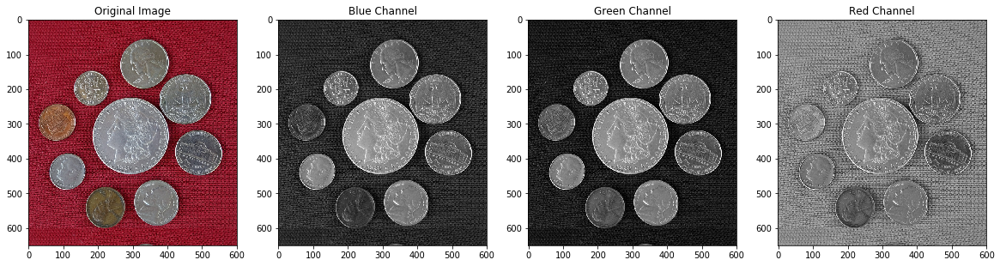

In [7]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

bool (650, 600) (650, 600) uint8


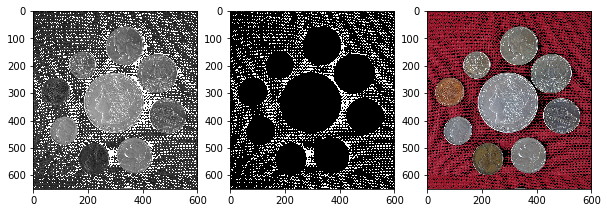

In [8]:
###
# numpy masking
maskB = image[...,0] < 25
maskG = image[...,1] < 25
maskR = np.ones(imageR.shape)
mask = np.bitwise_and(maskB, maskG)
imgcopy = image.copy()
imgcopy[mask] = 0

# what is mask type, shape, etc?
print(maskB.dtype, maskB.shape, np.ma.masked_array(imageB, mask=maskB).shape, np.ma.masked_array(imageB, mask=maskB).dtype)

# what does an applied mask look like?
plt.subplot(131)
plt.imshow(np.ma.masked_array(imageB, mask=mask))

# what does the mask look like
plt.subplot(132)
plt.imshow(mask)

plt.subplot(133)
plt.imshow(imgcopy[:,:,::-1])
###

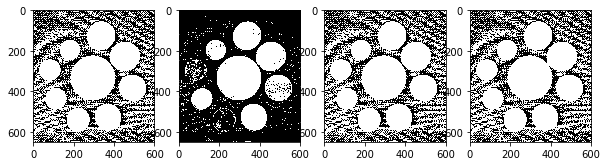

In [9]:
###
# openCV thresholding

# THRESH_BINARY  -> greater than
# THRESH_BINARY_INV -> less than
thb, imBth = cv2.threshold(imageB, 75 ,255, cv2.THRESH_BINARY)
thg, imGth = cv2.threshold(imageG, 25, 255, cv2.THRESH_BINARY)
thr, imRth = cv2.threshold(imageR, 30, 255, cv2.THRESH_BINARY_INV)

'''

maximize the circle of the coins and minimize the background using combined masks from
the RGB image then perform a binary not

''' 

immax = cv2.max(imBth, imGth)

plt.subplot(141)
plt.imshow(immax)

immin = cv2.min(imBth, imGth)

plt.subplot(142)
plt.imshow(immin)

immax = cv2.max(immax, immin)

plt.subplot(143)
plt.imshow(immax)

immax = cv2.max(immax, imRth)

plt.subplot(144)
plt.imshow(immax)
###


my final output


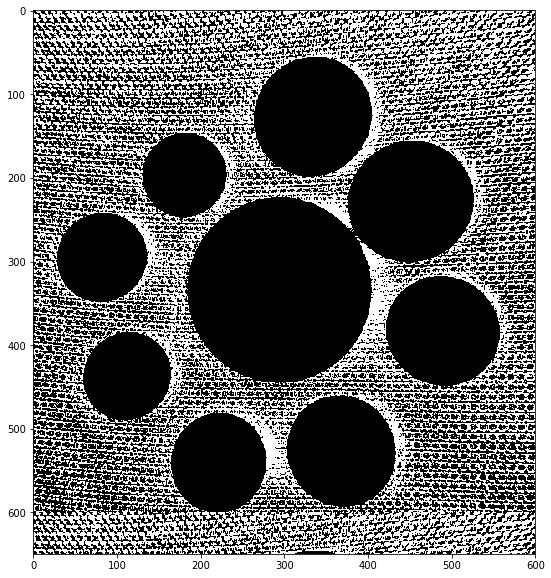

In [10]:
# Display the thresholded image
###

print('my final output')
max_not = cv2.bitwise_not(immax)
plt.imshow(max_not)

###


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [11]:
###

# try multiple kernels
m_3x3cross = cv2.getStructuringElement(cv2.MORPH_CROSS ,(3,3))
m_3x3rect = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))

m_4x4ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(4,4))
m_4x4rect = cv2.getStructuringElement(cv2.MORPH_RECT, (4,4))

m_5x5ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(5,5))
m_5x5rect = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))

###


In [12]:
###
# find the best image in the least amount of iterations
i = 3
d_3x3cross = cv2.dilate(max_not, m_3x3cross, iterations = i)
d_3x3rect = cv2.dilate(max_not, m_3x3rect, iterations = i)
d_4x4ellipse = cv2.dilate(max_not, m_4x4ellipse, iterations = i)
d_4x4rect = cv2.dilate(max_not, m_4x4rect, iterations = i)
d_5x5ellipse = cv2.dilate(max_not, m_5x5ellipse, iterations = i)
d_5x5rect = cv2.dilate(max_not, m_5x5rect, iterations = i)
###


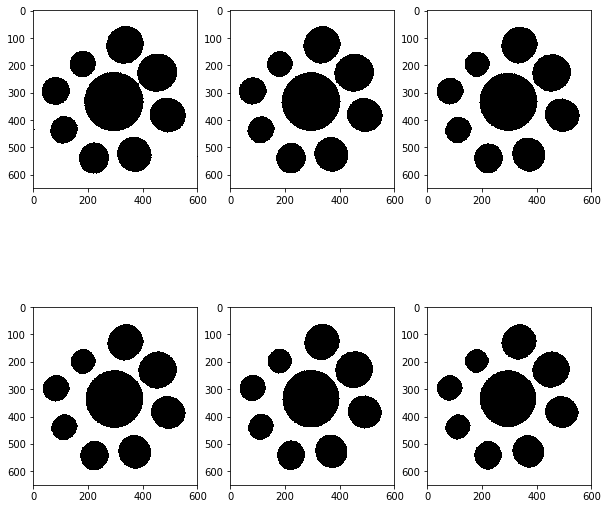

In [13]:
plt.subplot(231)
plt.imshow(d_3x3cross)
plt.subplot(232)
plt.imshow(d_3x3rect)
plt.subplot(233)
plt.imshow(d_4x4ellipse)
plt.subplot(234)
plt.imshow(d_4x4rect)
plt.subplot(235)
plt.imshow(d_5x5ellipse)
plt.subplot(236)
plt.imshow(d_5x5rect)

my final output


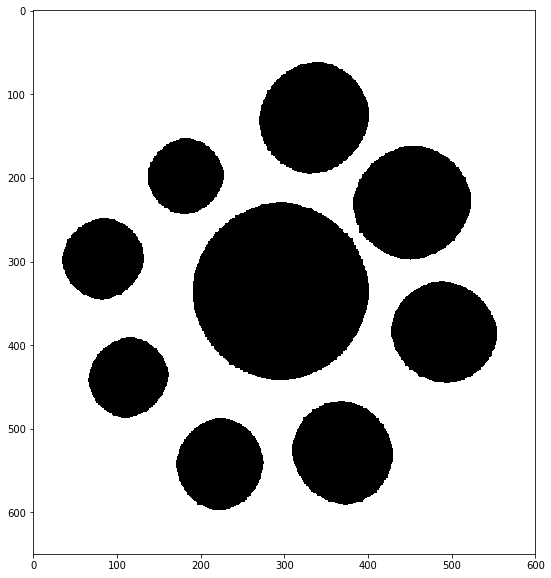

In [14]:
print('my final output')
choice = d_4x4rect
plt.imshow(choice)

In [15]:
# Display all the images
# you have obtained in the intermediate steps
###
### YOUR CODE HERE
###


In [15]:
# Get structuring element/kernel which will be used for dilation
###
# Reise the kernels
m_3x3cross = cv2.getStructuringElement(cv2.MORPH_CROSS ,(3,3))
m_3x3rect = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))

m_4x4ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(4,4))
m_4x4rect = cv2.getStructuringElement(cv2.MORPH_RECT, (4,4))

m_5x5ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(5,5))
m_5x5rect = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))

###


In [16]:
###
# find the best image in the least amount of iterations
i = 2
e_3x3cross = cv2.erode(choice, m_3x3cross, iterations = i)
e_3x3rect = cv2.erode(choice, m_3x3rect, iterations = i)
e_4x4ellipse = cv2.erode(choice, m_4x4ellipse, iterations = i)
e_4x4rect = cv2.erode(choice, m_4x4rect, iterations = i)
e_5x5ellipse = cv2.erode(choice, m_5x5ellipse, iterations = i)
e_5x5rect = cv2.erode(choice, m_5x5rect, iterations = i)
###


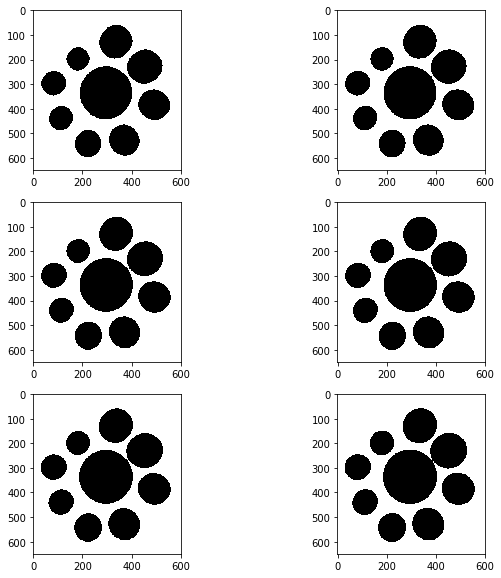

In [17]:
# look for the best one
plt.subplot(321)
plt.imshow(e_3x3cross)
plt.subplot(322)
plt.imshow(e_3x3rect)
plt.subplot(323)
plt.imshow(e_4x4ellipse)
plt.subplot(324)
plt.imshow(e_4x4rect)
plt.subplot(325)
plt.imshow(e_5x5ellipse)
plt.subplot(326)
plt.imshow(e_5x5rect)

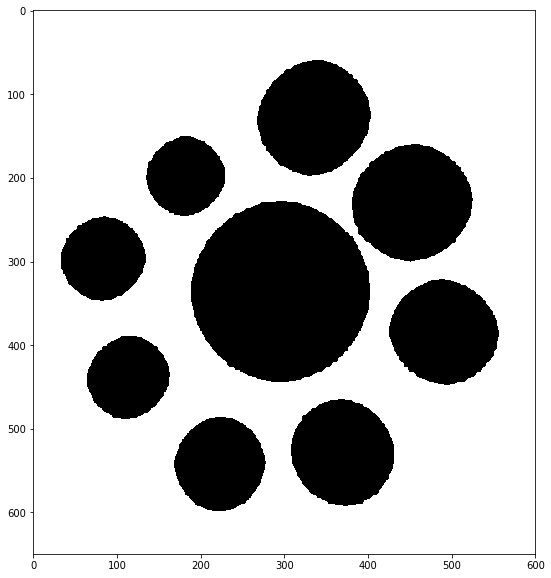

In [18]:
# they're all essentially good, personal choice I guess
choice2 = e_3x3cross
plt.imshow(choice2)

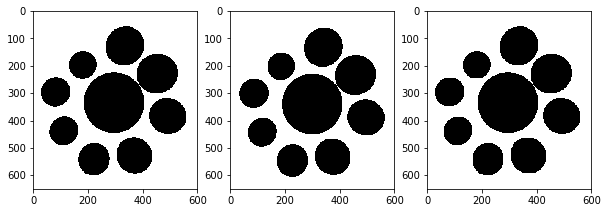

In [19]:
# using morphologyEx instead with rect kernels
# since the image I obtained is quite good, it only needs to patch the small holes
# this can be easily done using morphological close
i = 5 # iterations
c_3x3 = cv2.morphologyEx(max_not, cv2.MORPH_CLOSE, m_3x3rect, iterations = i)
c_4x4 = cv2.morphologyEx(max_not, cv2.MORPH_CLOSE, m_4x4rect, iterations = i)
c_5x5 = cv2.morphologyEx(max_not, cv2.MORPH_CLOSE, m_5x5rect, iterations = i)

plt.subplot(131)
plt.imshow(c_3x3)
plt.subplot(132)
plt.imshow(c_4x4)
plt.subplot(133)
plt.imshow(c_5x5)

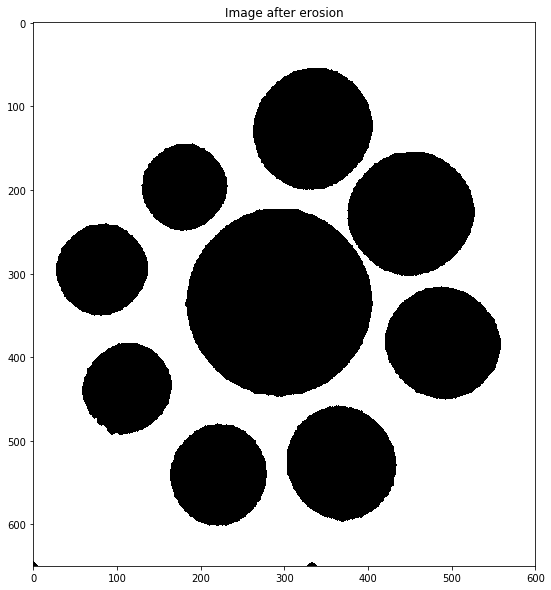

In [154]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [20]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [21]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [22]:
# Detect blobs
###
out = detector.detect(choice2)
out_c3x3 = detector.detect(c_3x3)
out_c4x4 = detector.detect(c_4x4)
out_c5x5 = detector.detect(c_5x5)
###


In [23]:
# Print number of coins detected
###
print('There are {} coins in the image from dilate -> erosion'.format(len(out)))
print('There are {} coins in the image from morphologyEx 3x3'.format(len(out_c3x3)))
print('There are {} coins in the image from morphologyEx 4x4'.format(len(out_c4x4)))
print('There are {} coins in the image from morphologyEx 5x5'.format(len(out_c5x5)))
# seems the 4x4 rect dilate and 3x3 cross erode did a better job at keeping the coin borders clean
# than performing the morphologyEx
###


There are 9 coins in the image from dilate -> erosion
There are 7 coins in the image from morphologyEx 3x3
There are 7 coins in the image from morphologyEx 4x4
There are 7 coins in the image from morphologyEx 5x5


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [24]:
# Mark coins using image annotation concepts we have studied so far
###
image2 = image.copy()
contours, hierarchy = cv2.findContours(choice2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image2, contours[:len(contours)-1], -1, (0,255,0), 3);
for k in out:
    x, y = k.pt
    size = k.size
    cv2.circle(image2, (int(x),int(y)), 10, (255,0,0), -1)
###


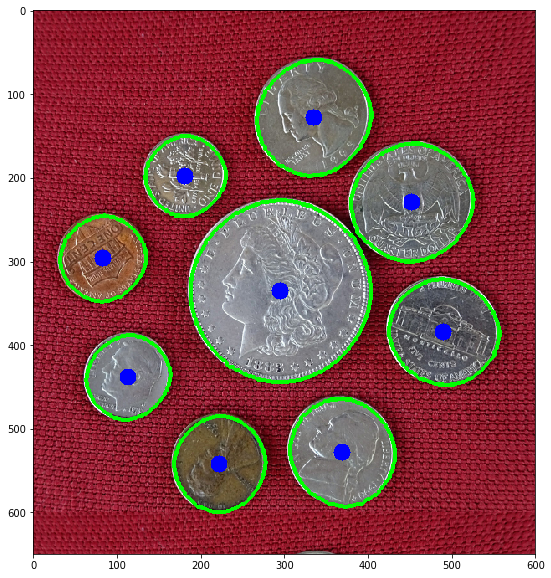

In [25]:
plt.imshow(image2[:,:,::-1])

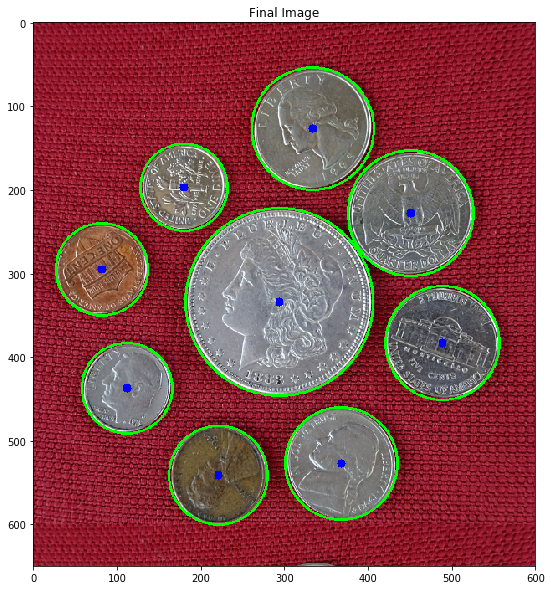

In [160]:
# Display the final image
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [26]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

In [27]:
# Find connected components
###
choice_not = cv2.bitwise_not(choice2)
_, coinlabels = cv2.connectedComponents(choice_not)
###


In [28]:
# Print number of connected components detected
###
print(coinlabels.max())
# Yes CCA can find the number of coins if you can segment each coin properly
###


9


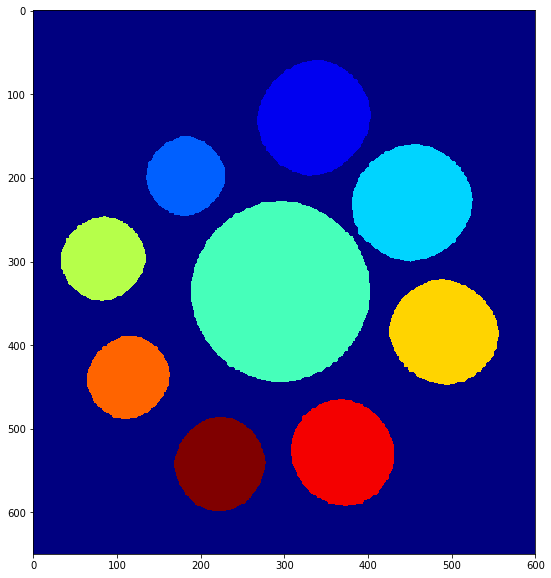

In [29]:
# Display connected components using displayConnectedComponents
displayConnectedComponents(coinlabels)

In [60]:
# Display connected components using displayConnectedComponents
# function
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [30]:
# Find all contours in the image
###


# Find all contours in the image
contours, hierarchy = cv2.findContours(choice2, cv2.RETR_LIST, cv2.CHAIN_APPROX_TC89_L1 )

###


In [31]:
# Print the number of contours found
###
print(len(contours))
###


10


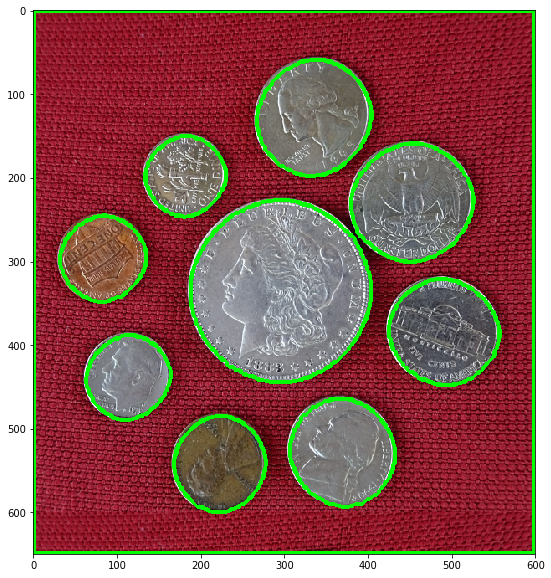

In [32]:
# Draw all contours
###
img = image.copy()
cv2.drawContours(img, contours, -1, (0,255,0), 3);
plt.imshow(img[:,:,::-1])
###


Let's only consider the outer contours.

In [33]:
help(cv2.rectangle)

Help on built-in function rectangle:

rectangle(...)
    rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]]) -> img
    .   @brief Draws a simple, thick, or filled up-right rectangle.
    .   
    .   The function cv::rectangle draws a rectangle outline or a filled rectangle whose two opposite corners
    .   are pt1 and pt2.
    .   
    .   @param img Image.
    .   @param pt1 Vertex of the rectangle.
    .   @param pt2 Vertex of the rectangle opposite to pt1 .
    .   @param color Rectangle color or brightness (grayscale image).
    .   @param thickness Thickness of lines that make up the rectangle. Negative values, like #FILLED,
    .   mean that the function has to draw a filled rectangle.
    .   @param lineType Type of the line. See #LineTypes
    .   @param shift Number of fractional bits in the point coordinates.
    
    
    
    rectangle(img, rec, color[, thickness[, lineType[, shift]]]) -> img
    .   @overload
    .   
    .   use `rec` parameter as alterna

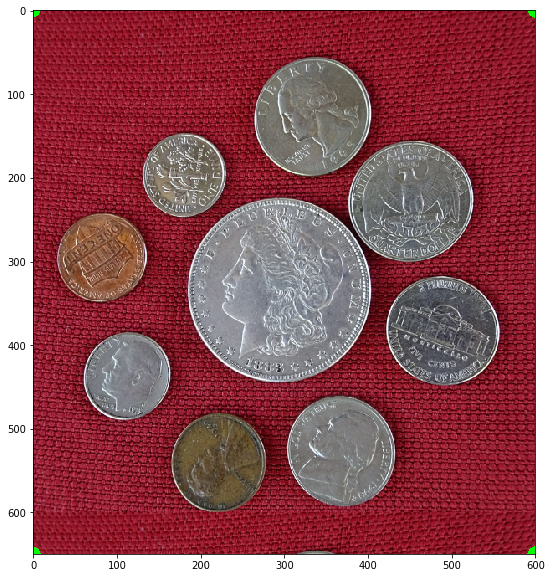

In [34]:
# Seems like its not drawing the borders completely so, I'll try using cv2.rectangle
# contours, hierarchy = cv2.findContours(choice2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img = image.copy()
cv2.drawContours(img, contours[-1], -1, (0,255,0), 15);
plt.imshow(img[:,:,::-1])

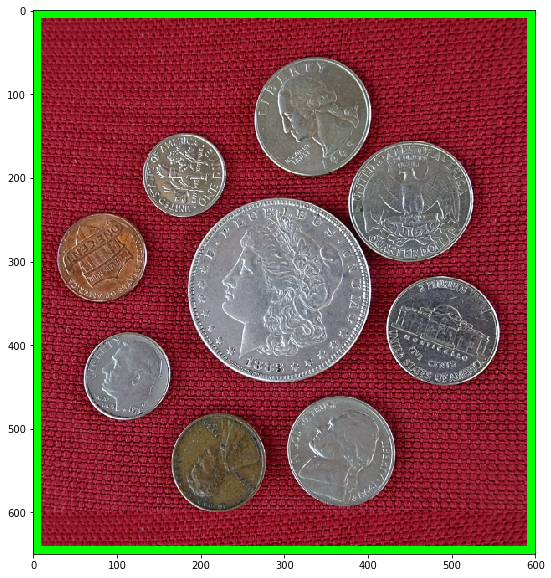

In [35]:
###
pointa = (contours[-1][0,0,0], contours[-1][0,0,1])
pointb = (contours[-1][2,0,0], contours[-1][2,0,1])
cv2.rectangle(img, pointa, pointb, (0,255,0), thickness = 15);
plt.imshow(img[:,:,::-1])
###

In [36]:

for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area,perimeter))

Contour #1 has area = 9571.5 and perimeter = 354.9187889099121
Contour #2 has area = 12351.0 and perimeter = 408.84393084049225
Contour #3 has area = 7649.0 and perimeter = 317.9616346359253
Contour #4 has area = 12708.5 and perimeter = 411.33888268470764
Contour #5 has area = 7954.5 and perimeter = 323.8050400018692
Contour #6 has area = 36206.5 and perimeter = 696.4562997817993
Contour #7 has area = 15711.5 and perimeter = 457.898020863533
Contour #8 has area = 6955.5 and perimeter = 303.78125286102295
Contour #9 has area = 14445.0 and perimeter = 438.3469338417053
Contour #10 has area = 388751.0 and perimeter = 2496.0


So, we only need the inner contours. The easiest way to do that will be to remove the outer contour using area.

In [169]:
# Print area and perimeter of all contours
###
### YOUR CODE HERE
###


Contour #1 has area = 11118.0 and perimeter = 401.9310212135315
Contour #2 has area = 14133.5 and perimeter = 456.9432144165039
Contour #3 has area = 9075.5 and perimeter = 373.2030990123749
Contour #4 has area = 14482.5 and perimeter = 456.8010768890381
Contour #5 has area = 9404.5 and perimeter = 367.5462449789047
Contour #6 has area = 39121.5 and perimeter = 748.3645672798157
Contour #7 has area = 17612.0 and perimeter = 500.8427075147629
Contour #8 has area = 8298.5 and perimeter = 344.5756813287735
Contour #9 has area = 16370.5 and perimeter = 484.11478412151337
Contour #10 has area = 388697.0 and perimeter = 2497.4558429718018


In [37]:
# Print maximum area of contour
# This will be the box that we want to remove
###
area = cv2.contourArea(contours[-1])
print('Maximum area of contour = ' + str(area))
###

Maximum area of contour = 388751.0


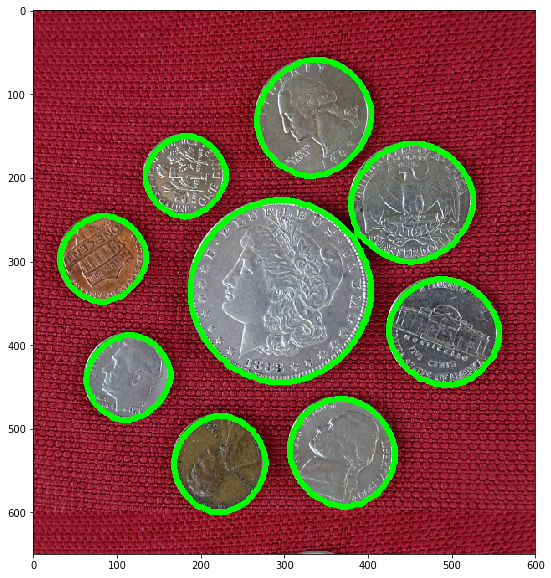

In [38]:
# Print maximum area of contour
# This will be the box that we want to remove
###
img = image.copy()
contours_copy = contours.copy()
for index,cnt in enumerate(contours_copy):
    a = cv2.contourArea(cnt)
    if area == a:
        contours_copy = np.delete(contours_copy, index)
cv2.drawContours(img, contours_copy, -1, (0,255,0), 5);
plt.imshow(img[:,:,::-1])
###


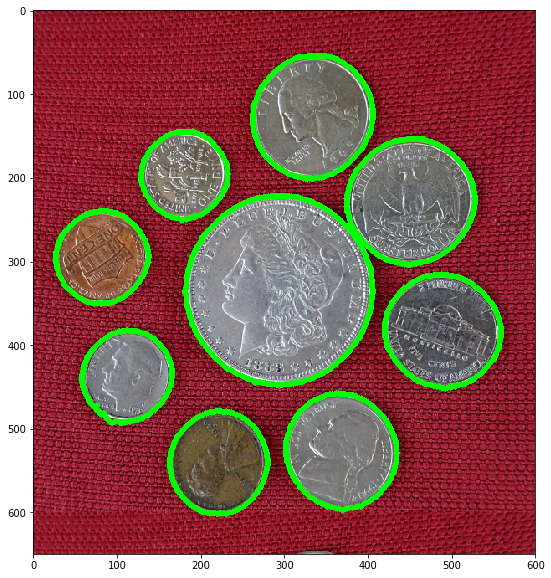

In [171]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###


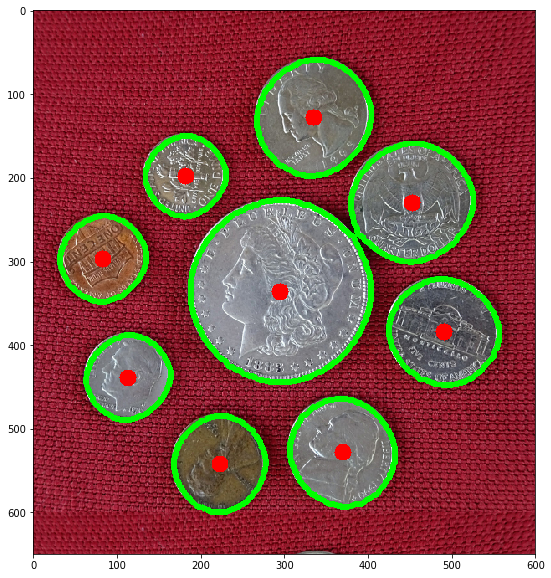

In [39]:
for index,cnt in enumerate(contours_copy):
    M = cv2.moments(cnt)
    x = int(round(M["m10"]/M["m00"]))
    y = int(round(M["m01"]/M["m00"]))
    # Mark the center
    cv2.circle(img, (x,y), 10, (0,0,255), -1);
plt.imshow(img[:,:,::-1])

Number of coins detected = 9


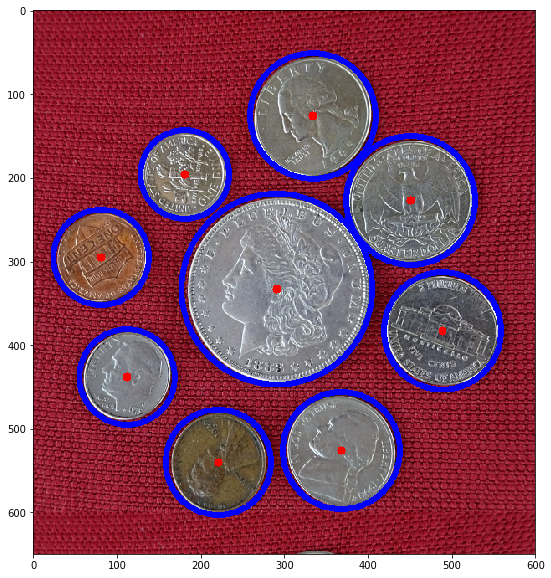

In [173]:
# Fit circles on coins
###
### YOUR CODE HERE
###


# <font style = "color:rgb(50,120,229)">Assignment Part - B</font>

**Follow the same steps as provided in Assignment Part - A**

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

Text(0.5,1,'Original Image')

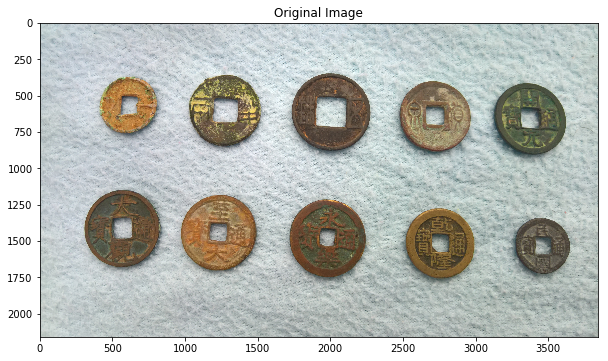

In [138]:
# Image path
imagePath = DATA_PATH + "images/CoinsB.png"
# Read image
# Store it in variable image
###
image = cv2.imread(imagePath)
###
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [41]:
# Convert to grayscale
# Store in variable imageGray
###
imageGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
###


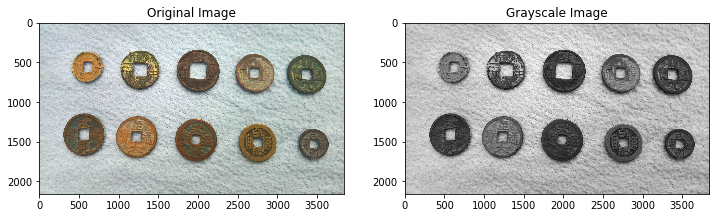

In [42]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [43]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
###
imageR = image[:,:,2]
imageG = image[:,:,1]
imageB = image[:,:,0]
###


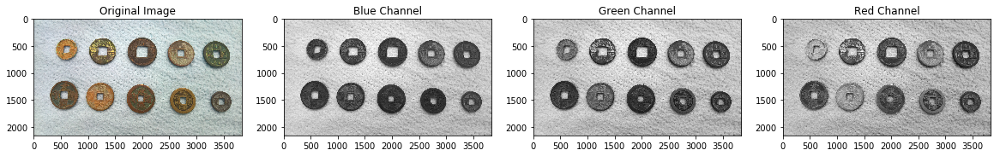

In [44]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [45]:
help(cv2.threshold)

Help on built-in function threshold:

threshold(...)
    threshold(src, thresh, maxval, type[, dst]) -> retval, dst
    .   @brief Applies a fixed-level threshold to each array element.
    .   
    .   The function applies fixed-level thresholding to a multiple-channel array. The function is typically
    .   used to get a bi-level (binary) image out of a grayscale image ( #compare could be also used for
    .   this purpose) or for removing a noise, that is, filtering out pixels with too small or too large
    .   values. There are several types of thresholding supported by the function. They are determined by
    .   type parameter.
    .   
    .   Also, the special values #THRESH_OTSU or #THRESH_TRIANGLE may be combined with one of the
    .   above values. In these cases, the function determines the optimal threshold value using the Otsu's
    .   or Triangle algorithm and uses it instead of the specified thresh.
    .   
    .   @note Currently, the Otsu's and Triangle methods a

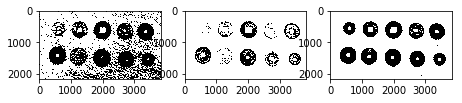

In [46]:
###
thr, imRth = cv2.threshold(imageR, 175 ,255, cv2.THRESH_BINARY)
thg, imGth = cv2.threshold(imageG, 90 ,255, cv2.THRESH_BINARY)
thb, imBth = cv2.threshold(imageB, 124 ,255, cv2.THRESH_BINARY)
###
plt.subplot(141)
plt.imshow(imRth)
plt.subplot(142)
plt.imshow(imGth)
plt.subplot(143)
plt.imshow(imBth)



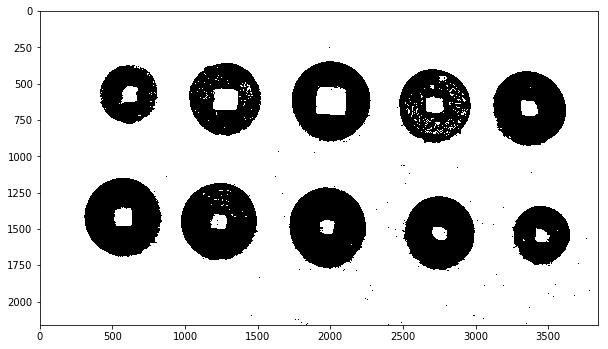

In [47]:
immax = cv2.bitwise_and(imRth, imBth)
plt.subplot(121)
plt.imshow(immax)

immax = cv2.bitwise_or(immax, imBth)
immax = cv2.bitwise_and(immax, imBth)
plt.subplot(111)
plt.imshow(immax)

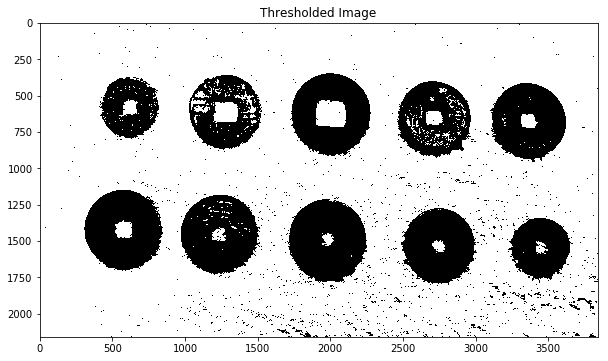

In [36]:
# Display image using matplotlib
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [48]:
###

# get kernels
m_3x3cross = cv2.getStructuringElement(cv2.MORPH_CROSS ,(3,3))
m_3x3rect = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))

m_4x4ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(4,4))
m_4x4rect = cv2.getStructuringElement(cv2.MORPH_RECT, (4,4))

m_5x5ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE ,(5,5))
m_5x5rect = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
###


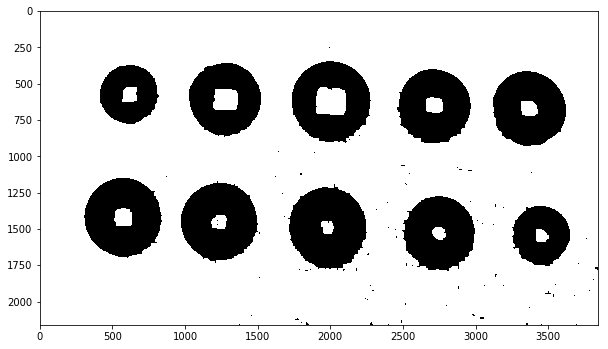

In [70]:
###

# Remove white holes
imcopy = immax.copy()
i = 5
# c_3x3 = cv2.morphologyEx(imcopy, cv2.MORPH_CLOSE, m_3x3rect, iterations = i)
o_5x5 = cv2.morphologyEx(imcopy, cv2.MORPH_OPEN, m_5x5rect, iterations = i)
# plt.imshow(c_3x3)
plt.imshow(o_5x5)
###


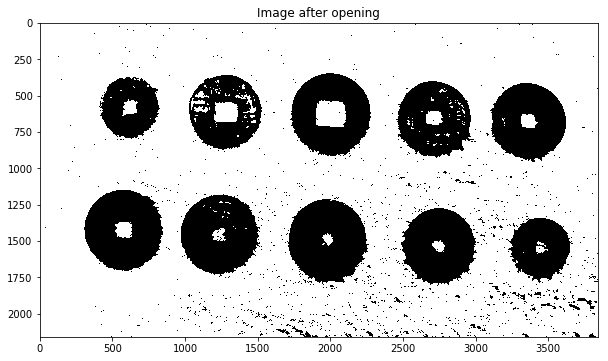

In [39]:
###
### YOUR CODE HERE
###


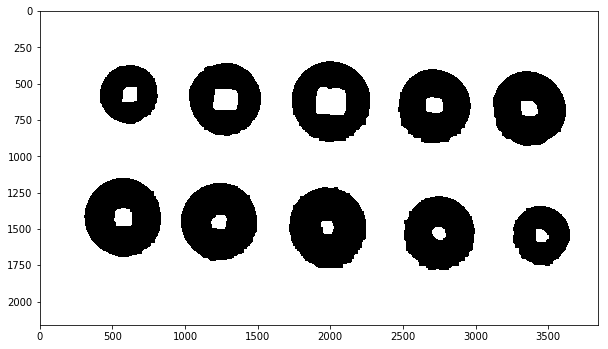

In [71]:
###

# remove black holes
c_5x5 = o_5x5.copy()
i = 5
# c_3x3 = cv2.morphologyEx(imcopy, cv2.MORPH_CLOSE, m_3x3rect, iterations = i)
c_5x5 = cv2.morphologyEx(c_5x5, cv2.MORPH_CLOSE, m_5x5rect, iterations = i)
# plt.imshow(c_3x3)
plt.imshow(c_5x5)
###


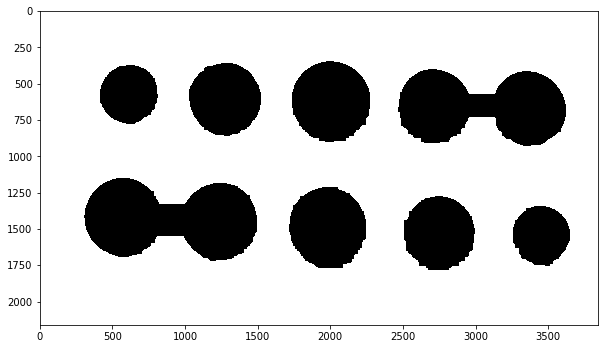

In [80]:
c_5x5_2 = c_5x5.copy()
i = 45
c_5x5_2 = cv2.morphologyEx(c_5x5_2, cv2.MORPH_OPEN, m_5x5rect, iterations = i)
# too much
plt.imshow(c_5x5_2)

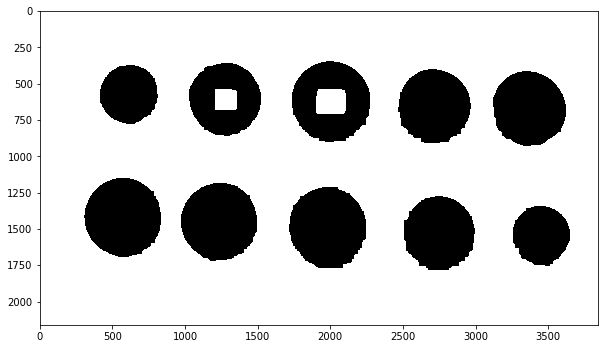

In [123]:
###

# remove coin centers
c_5x5_2 = c_5x5.copy()
i = 25
c_5x5_2 = cv2.morphologyEx(c_5x5_2, cv2.MORPH_OPEN, m_5x5rect, iterations = i)
plt.imshow(c_5x5_2)
###


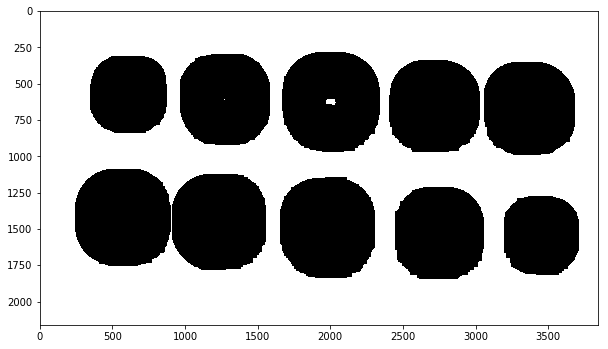

In [124]:
i = 32
c_5x5_2 = cv2.erode(c_5x5_2, m_5x5rect, iterations = i)

plt.imshow(c_5x5_2)

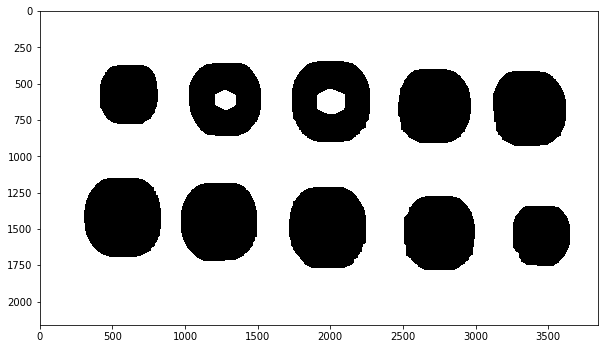

In [125]:
i = 32
c_5x5_2 = cv2.dilate(c_5x5_2, m_5x5ellipse, iterations = i)

plt.imshow(c_5x5_2)

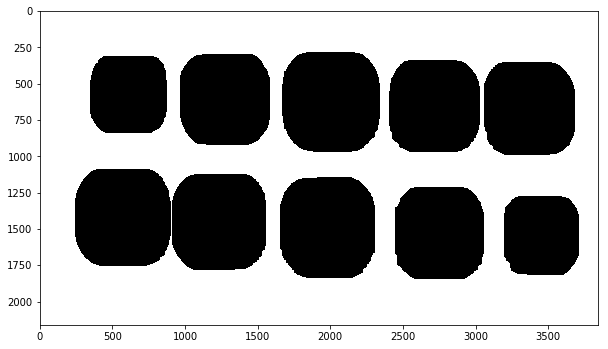

In [126]:
i = 32
c_5x5_2 = cv2.erode(c_5x5_2, m_5x5rect, iterations = i)

plt.imshow(c_5x5_2)

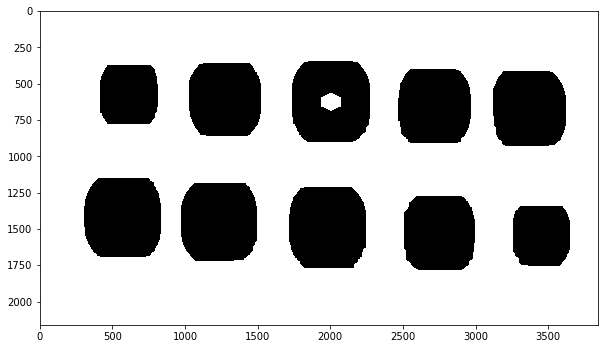

In [127]:
i = 32
c_5x5_2 = cv2.dilate(c_5x5_2, m_5x5ellipse, iterations = i)

plt.imshow(c_5x5_2)

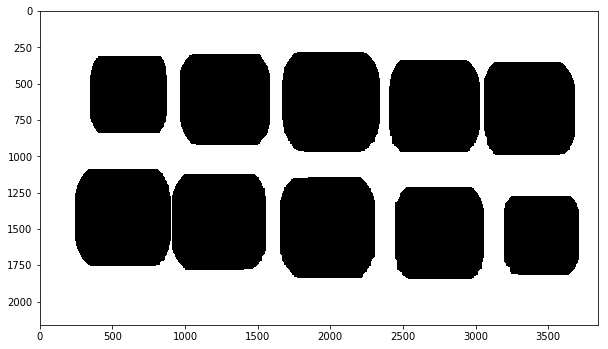

In [128]:
i = 32
c_5x5_2 = cv2.erode(c_5x5_2, m_5x5rect, iterations = i)

plt.imshow(c_5x5_2)

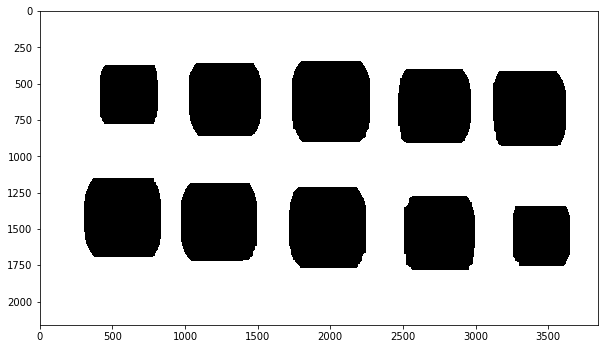

In [129]:
i = 32
c_5x5_2 = cv2.dilate(c_5x5_2, m_5x5ellipse, iterations = i)

plt.imshow(c_5x5_2)

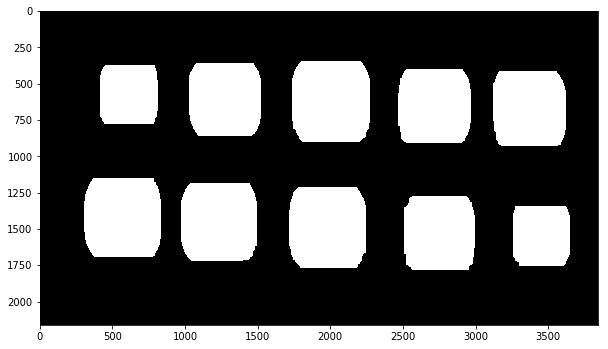

In [130]:
c_5x5_2_not = c_5x5_2.copy()
c_5x5_2_not = cv2.bitwise_not(c_5x5_2_not)

plt.imshow(c_5x5_2_not)

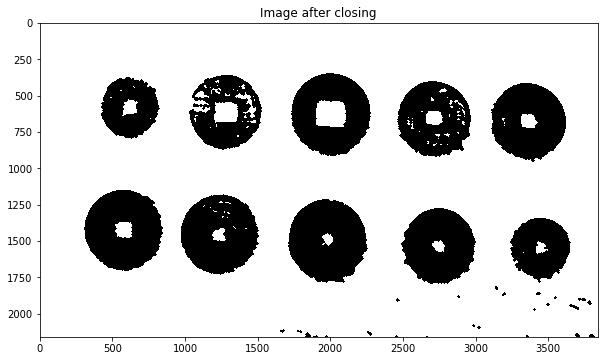

In [42]:
###
### YOUR CODE HERE
###


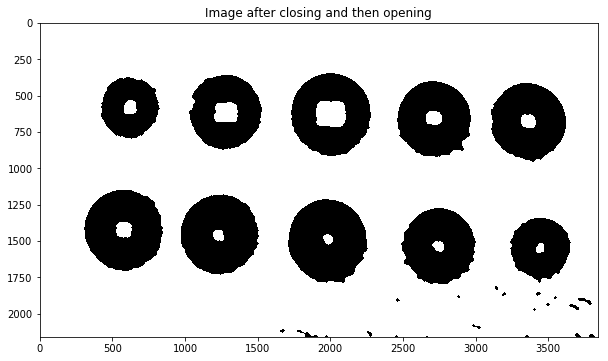

In [45]:
###
### YOUR CODE HERE
###


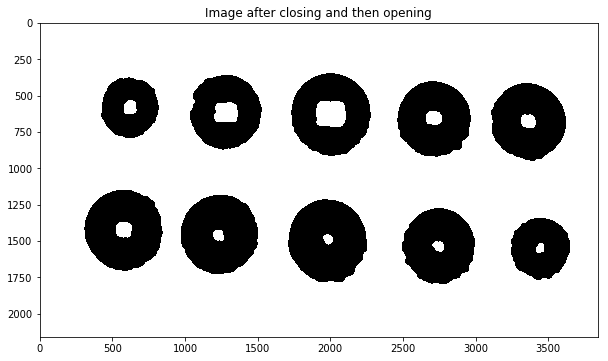

In [47]:
###
### YOUR CODE HERE
###


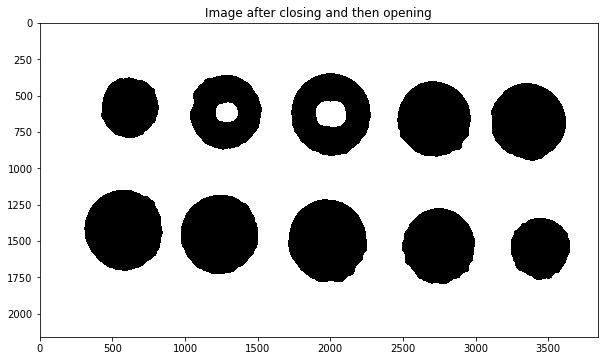

In [49]:
###
### YOUR CODE HERE
###


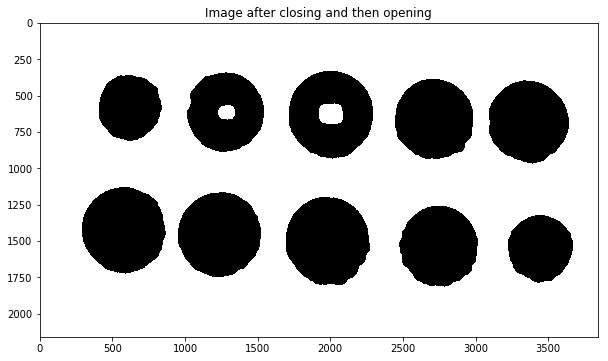

In [50]:
###
### YOUR CODE HERE
###


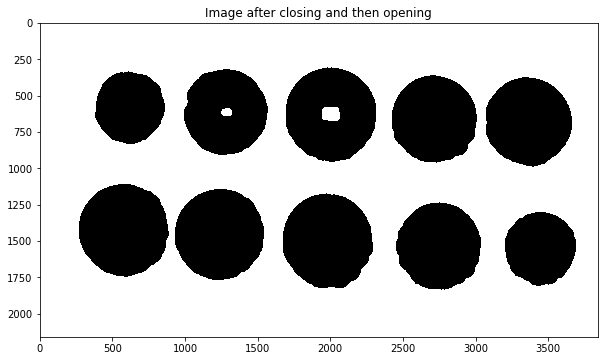

In [51]:
###
### YOUR CODE HERE
###


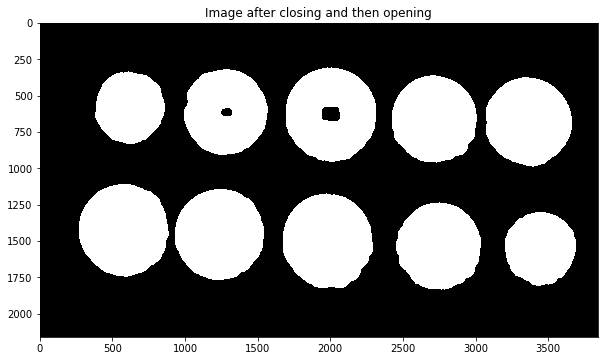

In [52]:
###
### YOUR CODE HERE
###


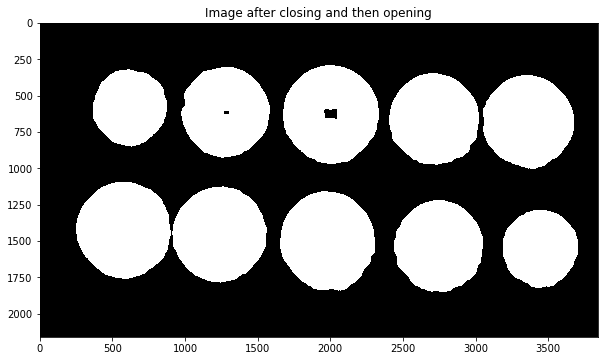

In [53]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [131]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [132]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)


## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [136]:
###
out = detector.detect(c_5x5_2)
###

print('There are {} number of coins detected'.format(len(out)))

There are 10 number of coins detected


In [56]:
# Detect blobs
###
### YOUR CODE HERE
###


Number of coins detected = 8


## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [148]:
###
image2 = image.copy()
contours, hierarchy = cv2.findContours(c_5x5_2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image2, contours[:len(contours)-1], -1, (0,0,255), 15);
for k in out:
    x, y = k.pt
    size = k.size
    cv2.circle(image2, (int(x),int(y)), 15, (0,0,255), -1)
###


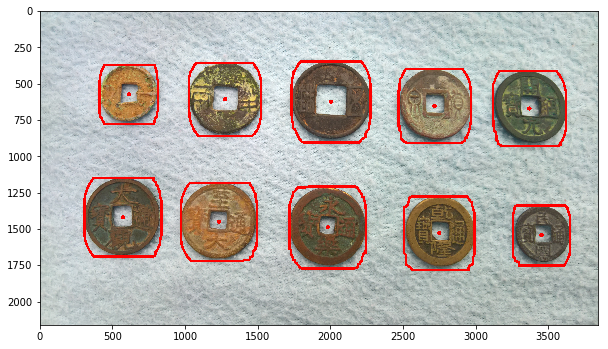

In [149]:
###
plt.imshow(image2[:,:,::-1])
###


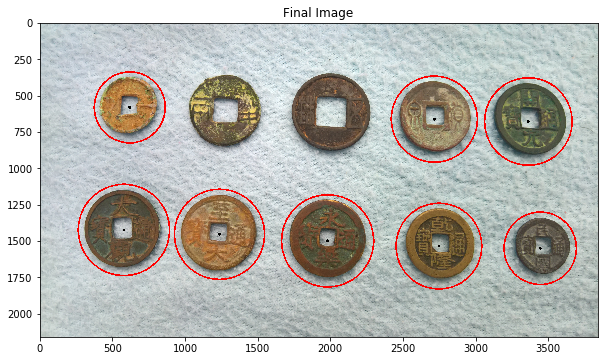

In [59]:
###
### YOUR CODE HERE
###


**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [150]:
###
_, coinlabels = cv2.connectedComponents(c_5x5_2_not)
print('Number of connected components detected = {}'.format(coinlabels.max()))
###


Number of connected components detected = 10


In [61]:
###
### YOUR CODE HERE
###


Number of connected components detected = 11


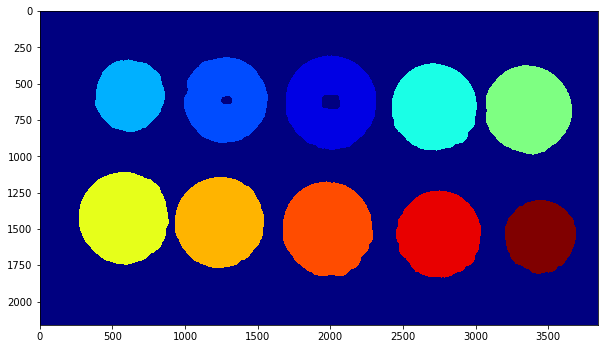

In [62]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

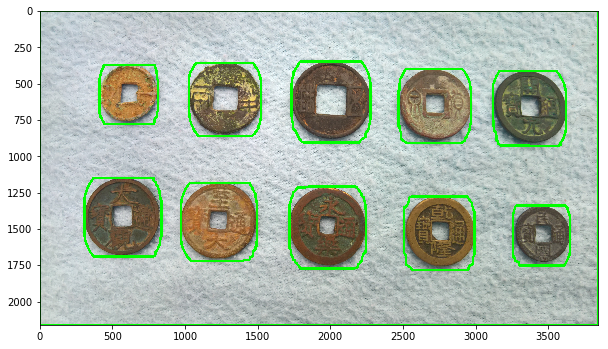

In [161]:
contours, hierarchy = cv2.findContours(c_5x5_2, cv2.RETR_LIST, cv2.CHAIN_APPROX_TC89_L1 )

img = image.copy()
cv2.drawContours(img, contours, -1, (0,255,0), 15);
plt.imshow(img[:,:,::-1])

In [163]:
print('Number of contours found = ' + str(len(contours)))

Number of contours found = 11


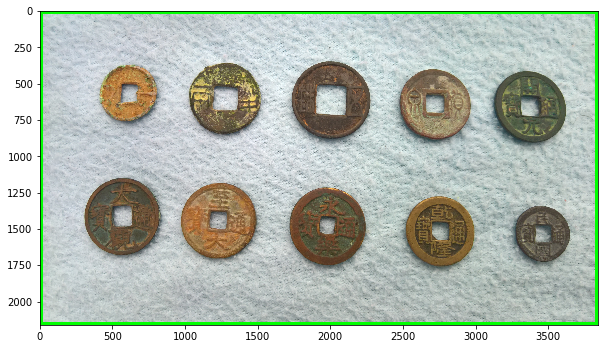

In [168]:
img = image.copy()
pointa = (contours[-1][0,0,0], contours[-1][0,0,1])
pointb = (contours[-1][2,0,0], contours[-1][2,0,1])
cv2.rectangle(img, pointa, pointb, (0,255,0), thickness = 35);
plt.imshow(img[:,:,::-1])

In [169]:
for index,cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    print("Contour #{} has area = {} and perimeter = {}".format(index+1,area,perimeter))

Contour #1 has area = 157365.0 and perimeter = 1532.5456628799438
Contour #2 has area = 236831.0 and perimeter = 1877.691454052925
Contour #3 has area = 281810.0 and perimeter = 2033.693351507187
Contour #4 has area = 269026.5 and perimeter = 1978.3576093912125
Contour #5 has area = 272829.0 and perimeter = 1995.384328007698
Contour #6 has area = 247048.0 and perimeter = 1897.9882044792175
Contour #7 has area = 241793.0 and perimeter = 1879.4883056879044
Contour #8 has area = 158423.0 and perimeter = 1543.7870047092438
Contour #9 has area = 237173.5 and perimeter = 1854.58200776577
Contour #10 has area = 287290.0 and perimeter = 2030.7753928899765
Contour #11 has area = 8288401.0 and perimeter = 11996.0


In [170]:
area = cv2.contourArea(contours[-1])
print('Maximum area of contour = ' + str(area))

Maximum area of contour = 8288401.0


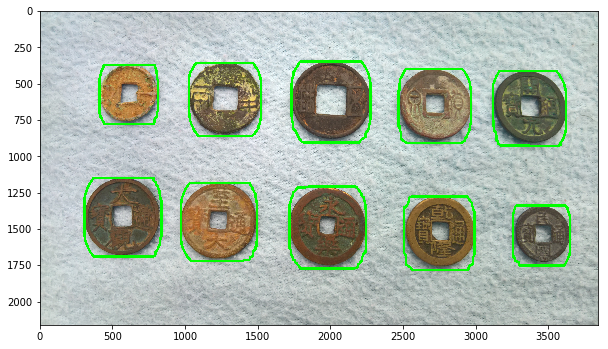

In [174]:
img = image.copy()
contours_copy = contours.copy()
for index,cnt in enumerate(contours_copy):
    a = cv2.contourArea(cnt)
    if area == a:
        contours_copy = np.delete(contours_copy, index)
cv2.drawContours(img, contours_copy, -1, (0,255,0), 15);
plt.imshow(img[:,:,::-1])

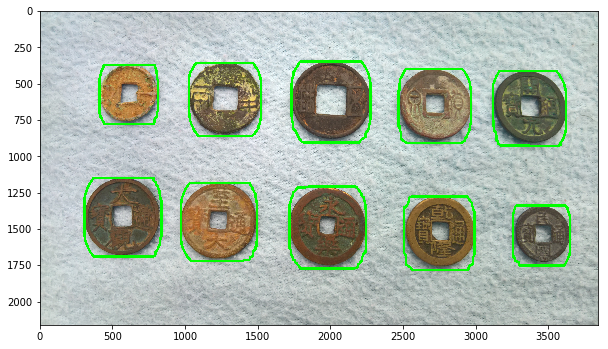

In [175]:
img = image.copy()
cv2.drawContours(img, contours_copy, -1, (0,255,0), 15);
plt.imshow(img[:,:,::-1])

In [178]:
# print sorted area
area_lst = []
for cnt in contours_copy:
    a = cv2.contourArea(cnt)
    area_lst.append(a)
sorted(area_lst)
for a in area_lst:
    print(a)

157365.0
236831.0
281810.0
269026.5
272829.0
247048.0
241793.0
158423.0
237173.5
287290.0


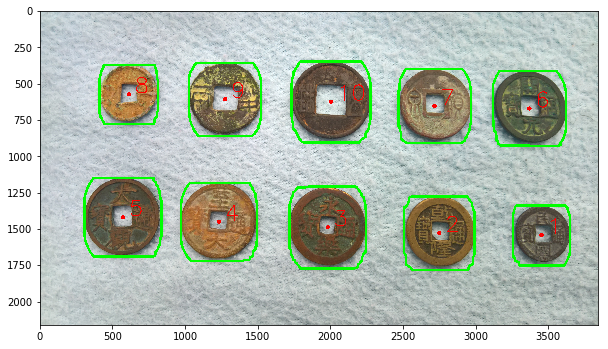

In [188]:
img = image.copy()
cv2.drawContours(img, contours_copy, -1, (0,255,0), 15);
index = 0
for k in out:
    index += 1
    x, y = k.pt
    size = k.size
    cv2.circle(img, (int(x),int(y)), 15, (0,0,255), -1)
    cv2.putText(img, "{}".format(index), ((int(x+40)), (int(y-10))), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 0, 255),5);
plt.imshow(img[:,:,::-1])
# can't fit the circles to the coin

In [64]:
# Print the number of contours found
###
### YOUR CODE HERE
###


Number of contours found = 13


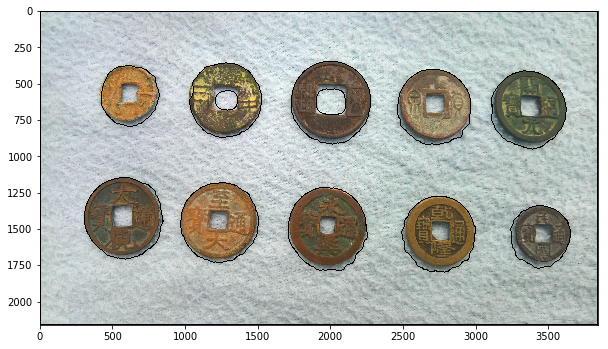

In [65]:
# Draw all contours
###
### YOUR CODE HERE
###


Number of contours found = 1


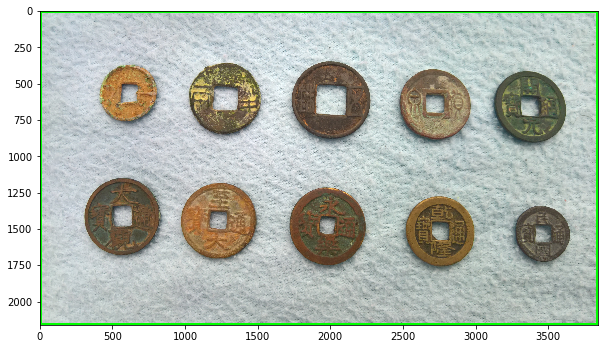

In [66]:
# Remove the inner contours
# Display the result
###
### YOUR CODE HERE
###


What do you think went wrong? As we can see, the outer box was detected as a contour and with respect to it, all other contours are internal and that's why they were not detected. How do we remove that? Let's see if we can use area of contours here.

In [67]:
# Print area and perimeter of all contours
###
### YOUR CODE HERE
###


Contour #1 has area = 135398.0 and perimeter = 1401.449918627739
Contour #2 has area = 203535.5 and perimeter = 1720.5697610378265
Contour #3 has area = 242100.5 and perimeter = 1871.0794281959534
Contour #4 has area = 229459.0 and perimeter = 1813.3809397220612
Contour #5 has area = 235121.5 and perimeter = 1837.1382957696915
Contour #6 has area = 16605.5 and perimeter = 485.2031031847
Contour #7 has area = 30872.0 and perimeter = 666.9015874862671
Contour #8 has area = 213446.5 and perimeter = 1743.339308977127
Contour #9 has area = 207230.0 and perimeter = 1723.2144236564636
Contour #10 has area = 130007.0 and perimeter = 1371.1067732572556
Contour #11 has area = 197785.0 and perimeter = 1696.1261086463928
Contour #12 has area = 243313.0 and perimeter = 1854.836783528328
Contour #13 has area = 8288401.0 and perimeter = 11996.0


In [68]:
# Print maximum area of contour
# This will be the box that we want to remove
###
### YOUR CODE HERE
###


Maximum area of contour = 8288401.0


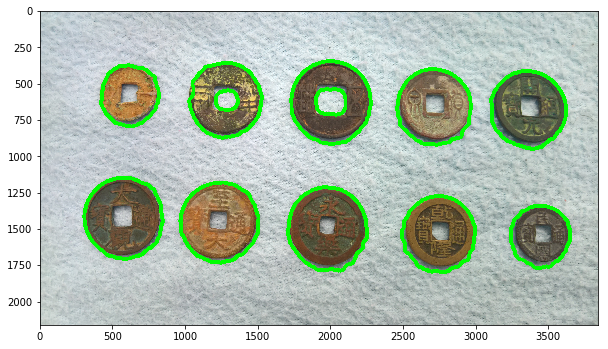

In [69]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###


Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [70]:
# Print sorted area of contours
###
### YOUR CODE HERE
###


16605.5
30872.0
130007.0
135398.0
197785.0
203535.5
207230.0
213446.5
229459.0
235121.5
242100.5
243313.0
8288401.0


We can clearly see the jump from 2nd area to 3rd. These are the 2 inner contours.

Number of contours = 10


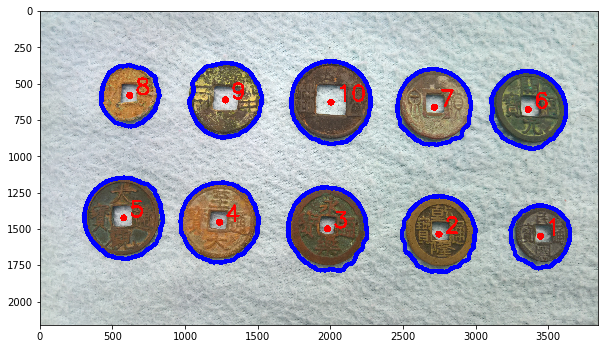

In [71]:
# Remove the 2 inner contours
# Plot the rest of them
###
### YOUR CODE HERE
###


Number of coins detected = 10


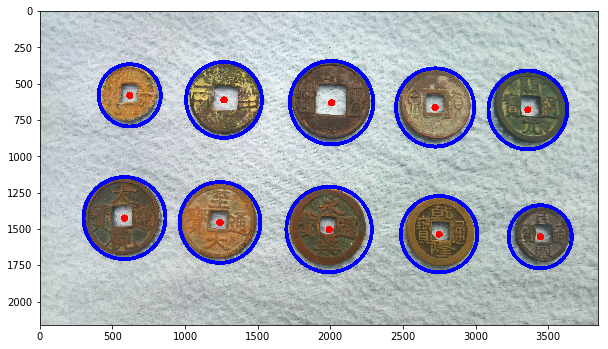

In [72]:
# Fit circles on coins
###
### YOUR CODE HERE
###
